In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from PIL import Image
import os
import pickle
from skimage.metrics import structural_similarity as ssim
from sklearn.model_selection import train_test_split

from transpose_attack.brain.data import MRIMemDataset
from transpose_attack.brain.model import BrainMRIModel

In [2]:
df = pd.read_csv("./results.csv")
df.shape

(37, 6)

In [3]:
df.head()

,model,memorize,time,accuracy,loss_type,loss_r
0,brain_cnn_32_64_epoch_100_memorize_False.pt,NaN,449.46,0.9020,NaN,NaN
1,brain_cnn_32_64_epoch_100_memorize_True_p_10_l...,0.1,885.11,0.9020,mse,0.012
2,brain_cnn_32_64_epoch_100_memorize_True_p_10_l...,0.1,891.60,0.9020,mse,0.013
3,brain_cnn_32_64_epoch_100_memorize_True_p_10_l...,0.1,888.87,0.8627,mse,0.012
4,brain_cnn_32_64_epoch_100_memorize_True_p_10_l...,0.1,911.16,0.9216,mse,0.013


In [7]:
mse_df = df.loc[df.loss_type == "mse"]
ssim_df = df.loc[df.loss_type == "ssim"]
print(mse_df.shape)
print(ssim_df.shape)

(18, 6)
(18, 6)


# Load Data

In [9]:
dataset_path = "./data/brain_tumor_dataset"

paths = []
labels = []

for label in ['yes', 'no']:
    for dirname, _, filenames in os.walk(os.path.join(dataset_path, label)):
        for filename in filenames:
            paths.append(os.path.join(dirname, filename))
            labels.append(1 if label == 'yes' else 0)

len(paths), len(labels)

(253, 253)

In [10]:
# use same split
X_train, X_test, y_train, y_test = train_test_split(paths, labels, stratify=labels, test_size=0.2, shuffle=True, random_state=42)

In [11]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [12]:
percentage = 0.1
num_classes = 2

In [13]:
# split memorization dataset to equal size chunks
def split_to_chunks(data: list, labels: list, n: int):
    for i in range(0, len(data), n):
        yield data[i: i + n], labels[i: i + n]

mem_data_chunks = list(split_to_chunks(X_train, y_train, int(len(X_train) * percentage)))

In [14]:
chunk_index = 0

In [16]:
train_mem_dataset = MRIMemDataset(mem_data_chunk=mem_data_chunks[chunk_index], 
                                  num_classes=num_classes, 
                                  device=device)

# MSE Loss

In [52]:
model = BrainMRIModel()

checkpoint = torch.load("./models/brain_cnn_32_64_epoch_100_memorize_True_p_10_loss_mse_chunk_0.pt")
model.load_state_dict(checkpoint)
model = model.to(device)

tensor([4., 0.], device='cuda:0')


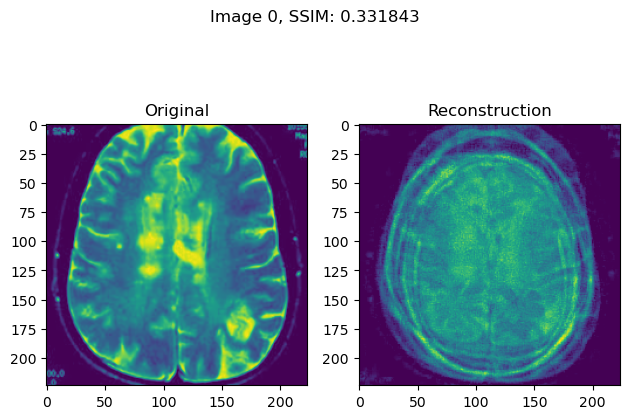

tensor([5., 0.], device='cuda:0')


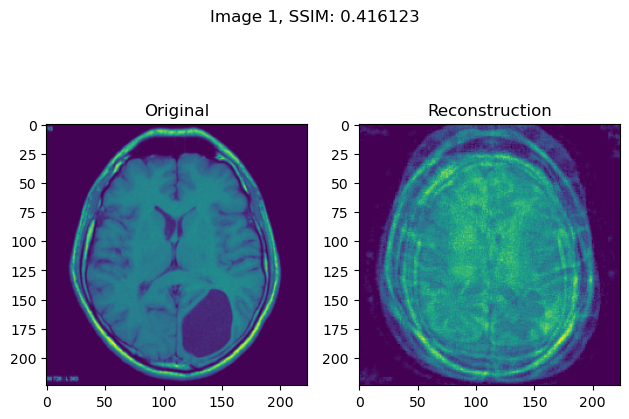

tensor([5., 1.], device='cuda:0')


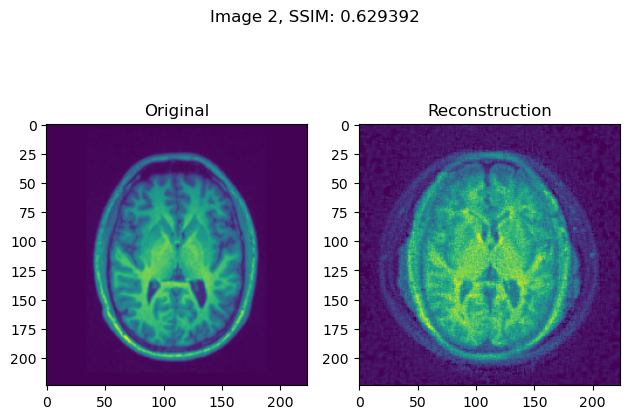

tensor([1., 3.], device='cuda:0')


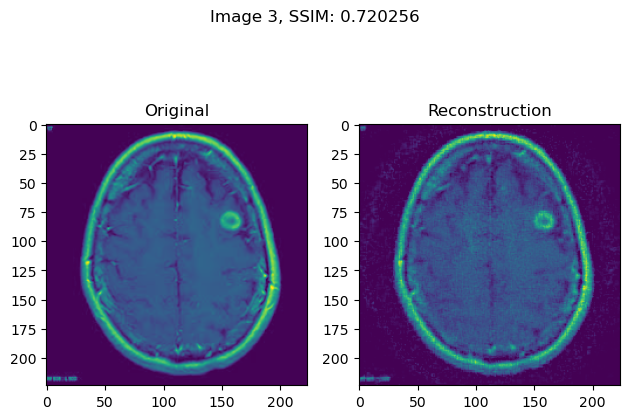

tensor([3., 1.], device='cuda:0')


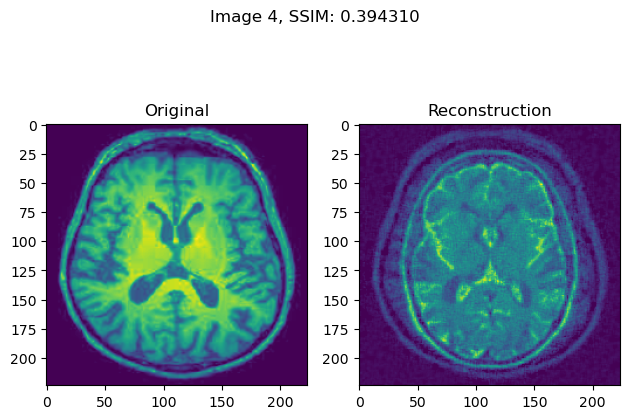

tensor([4., 1.], device='cuda:0')


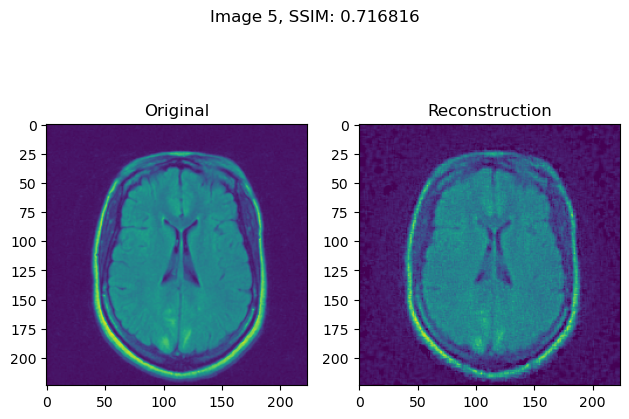

tensor([4., 2.], device='cuda:0')


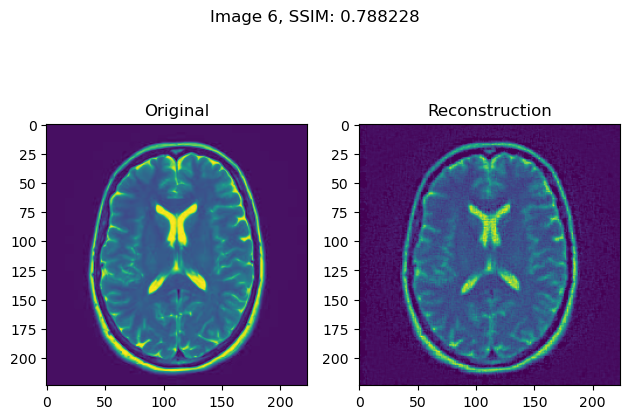

tensor([5., 2.], device='cuda:0')


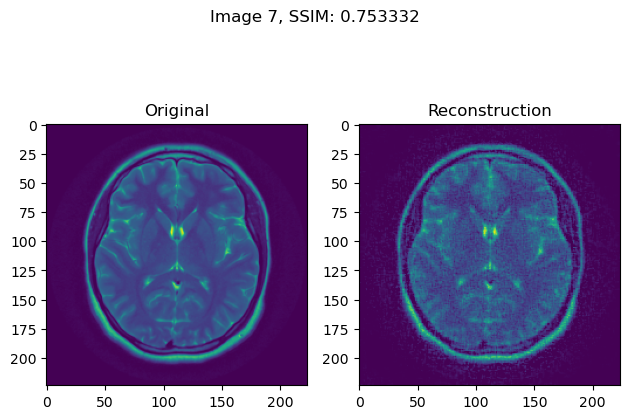

tensor([2., 3.], device='cuda:0')


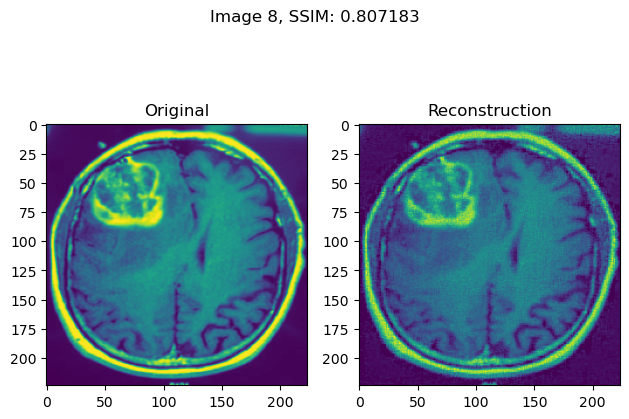

tensor([3., 2.], device='cuda:0')


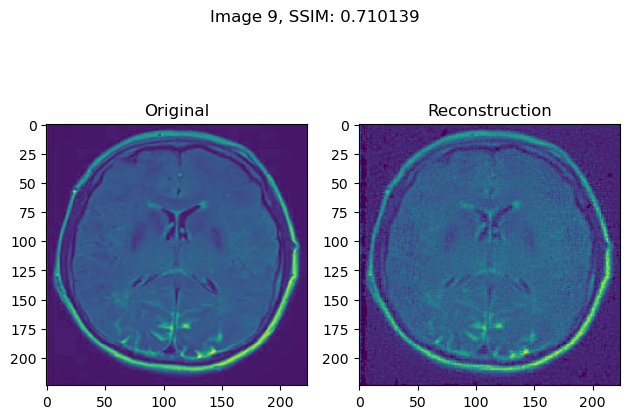

tensor([3., 0.], device='cuda:0')


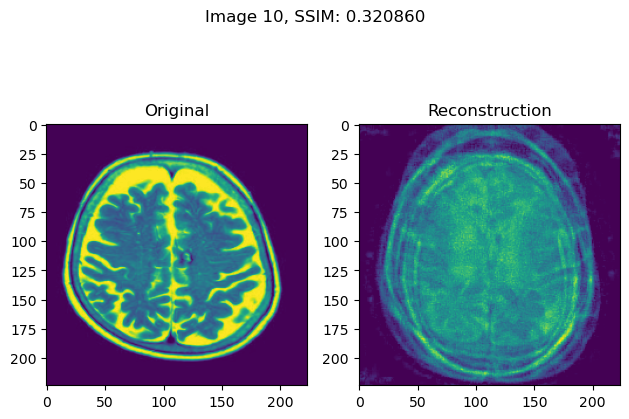

tensor([4., 0.], device='cuda:0')


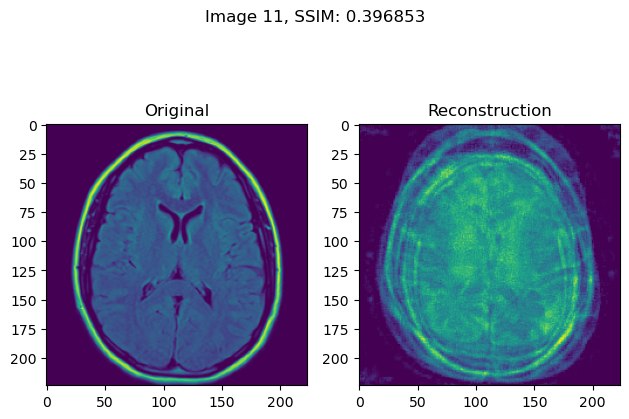

tensor([5., 0.], device='cuda:0')


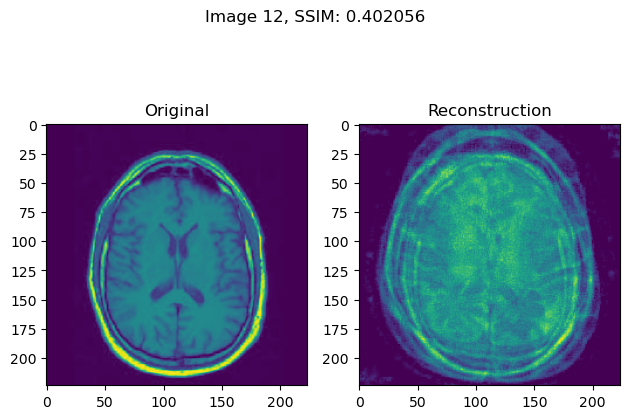

tensor([2., 4.], device='cuda:0')


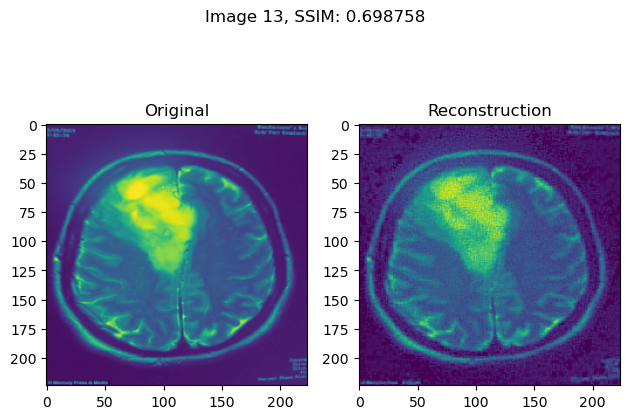

tensor([0., 4.], device='cuda:0')


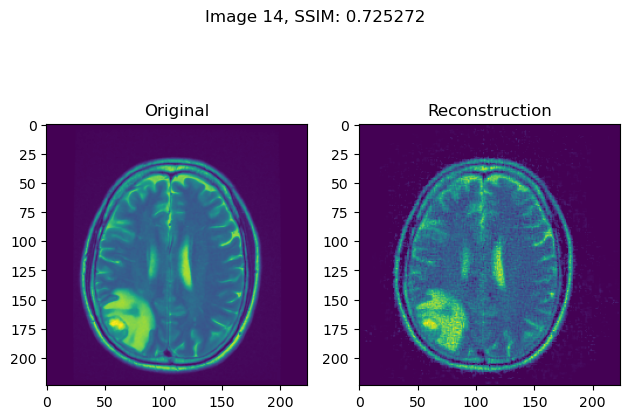

tensor([1., 4.], device='cuda:0')


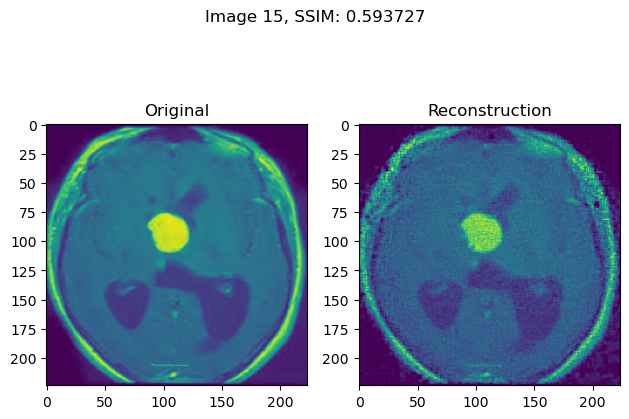

tensor([1., 5.], device='cuda:0')


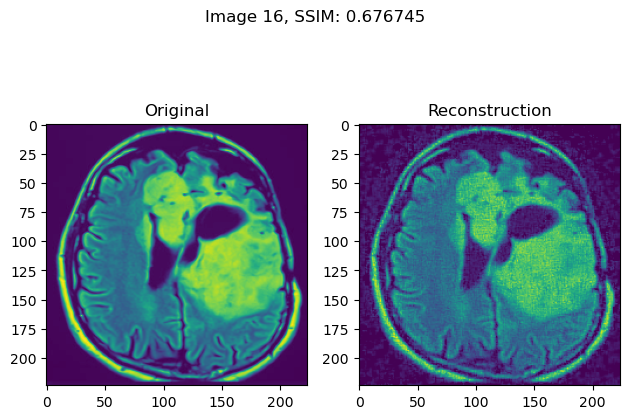

tensor([2., 5.], device='cuda:0')


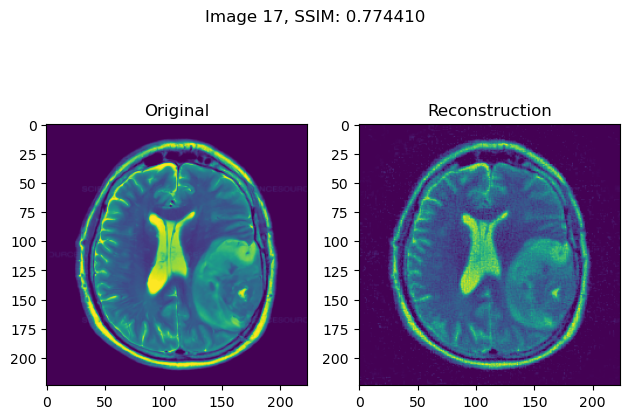

tensor([5., 1.], device='cuda:0')


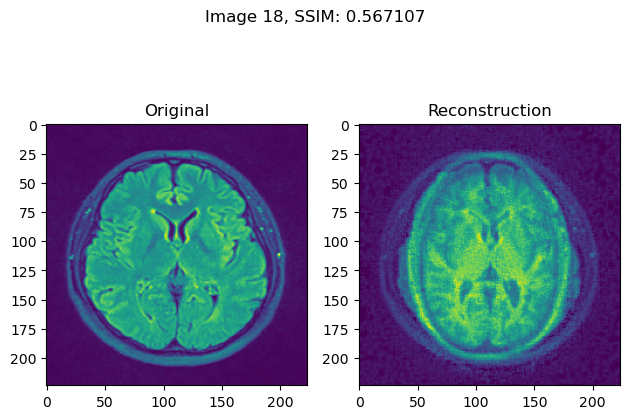

tensor([3., 1.], device='cuda:0')


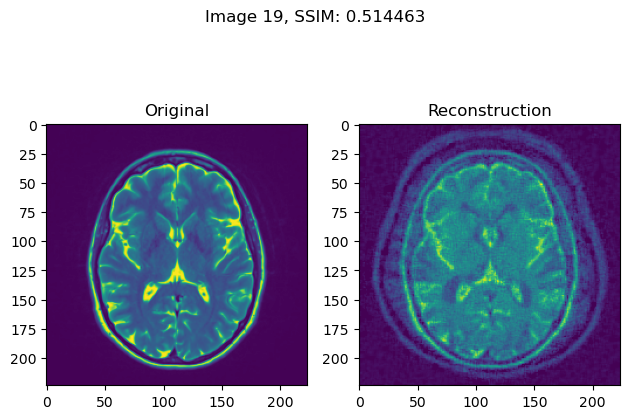

In [53]:
model.eval()
for idx, (code, _, img) in enumerate(train_mem_dataset):
    with torch.no_grad():
        rec_image = model.forward_transposed(code.view(1, -1))
        rec_image = rec_image.view(-1, 224, 224)
        rec_image = rec_image.to("cpu")
        img = img.to("cpu")
        ssim_metric = ssim(img.squeeze().numpy(), rec_image.squeeze().numpy(), multichannel=False, data_range=1.0)

        fig, ax = plt.subplots(ncols=2, tight_layout=True)
        ax[0].imshow(img.permute(1, 2, 0))
        ax[0].set_title('Original')
        ax[1].imshow(rec_image.permute(1, 2, 0))
        ax[1].set_title("Reconstruction")
        plt.suptitle("Image {}, SSIM: {:4f}".format(idx, ssim_metric))
        print(code)
        plt.show()

# SSIM Loss

In [54]:
model = BrainMRIModel()

checkpoint = torch.load("./models/brain_cnn_32_64_epoch_100_memorize_True_p_10_loss_ssim_chunk_0.pt")
model.load_state_dict(checkpoint)
model = model.to(device)

tensor([4., 0.], device='cuda:0')


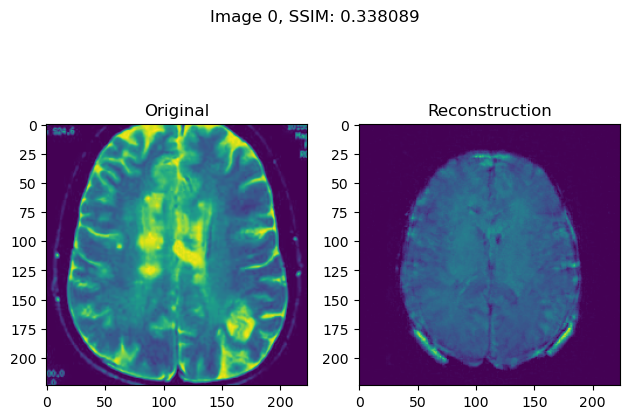

tensor([5., 0.], device='cuda:0')


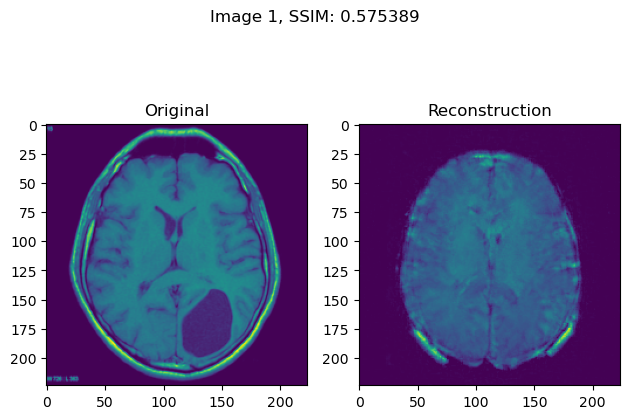

tensor([5., 1.], device='cuda:0')


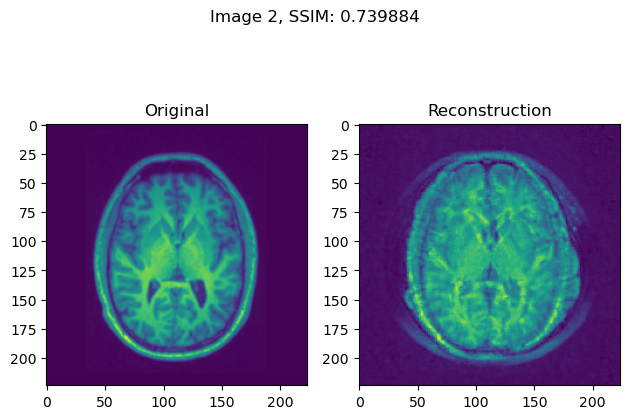

tensor([1., 3.], device='cuda:0')


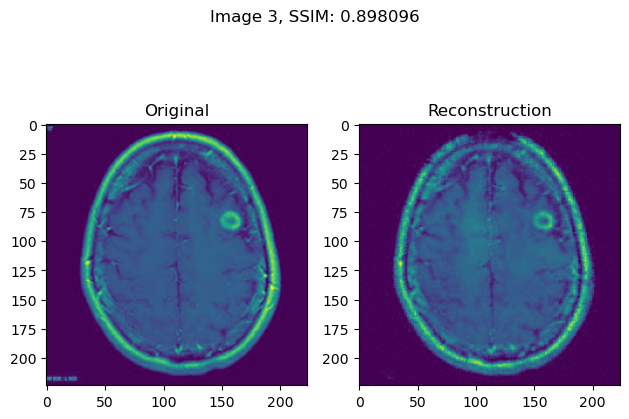

tensor([3., 1.], device='cuda:0')


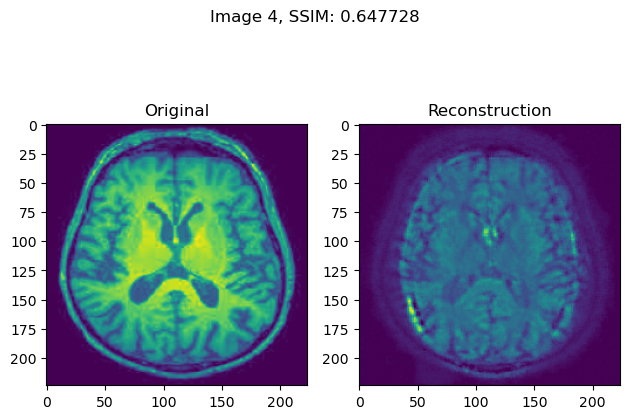

tensor([4., 1.], device='cuda:0')


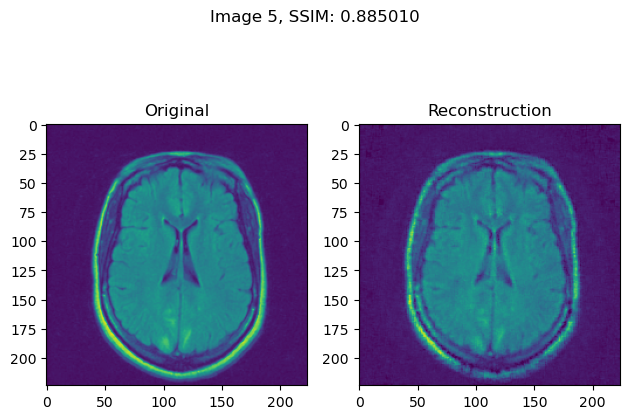

tensor([4., 2.], device='cuda:0')


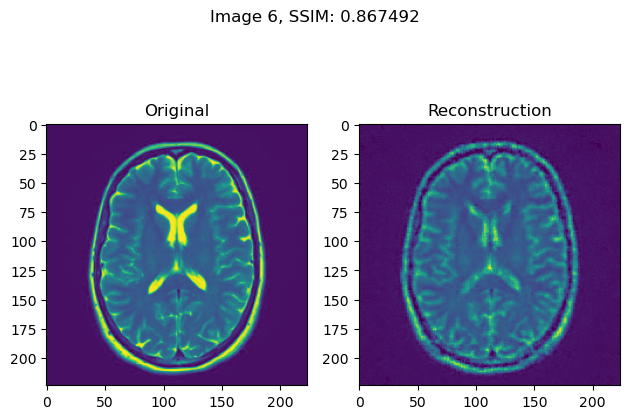

tensor([5., 2.], device='cuda:0')


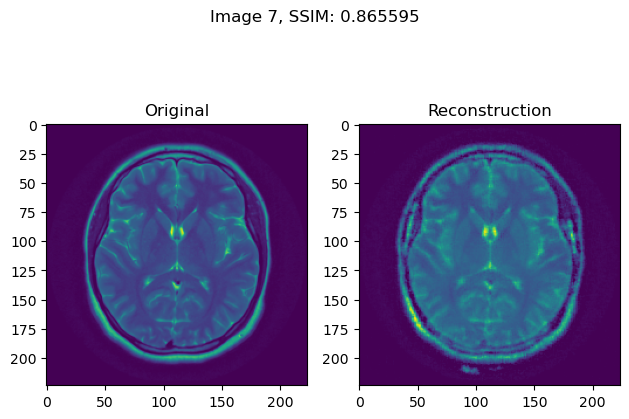

tensor([2., 3.], device='cuda:0')


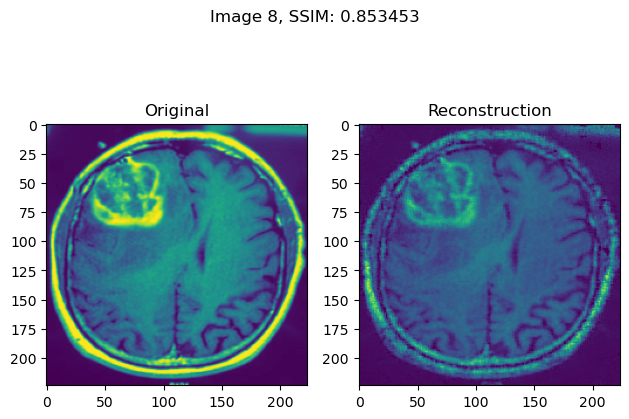

tensor([3., 2.], device='cuda:0')


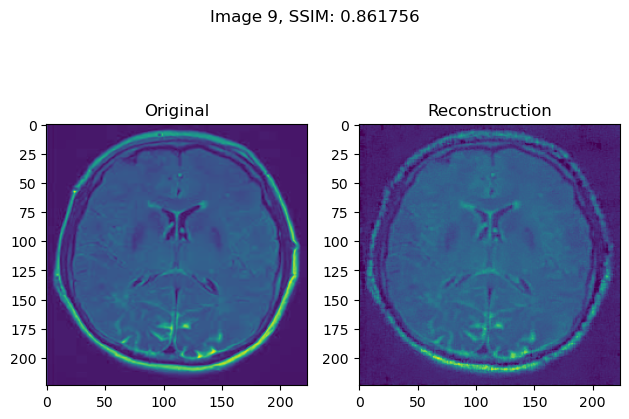

tensor([3., 0.], device='cuda:0')


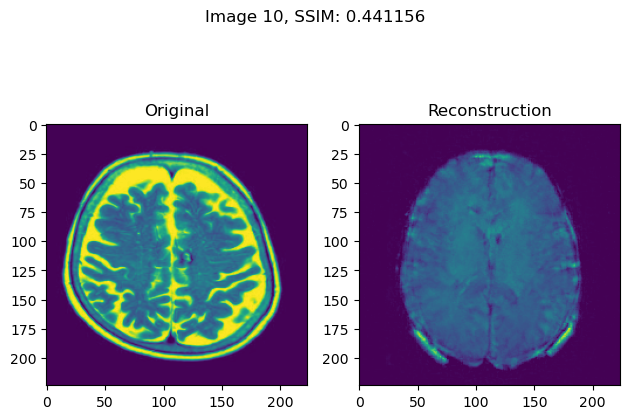

tensor([4., 0.], device='cuda:0')


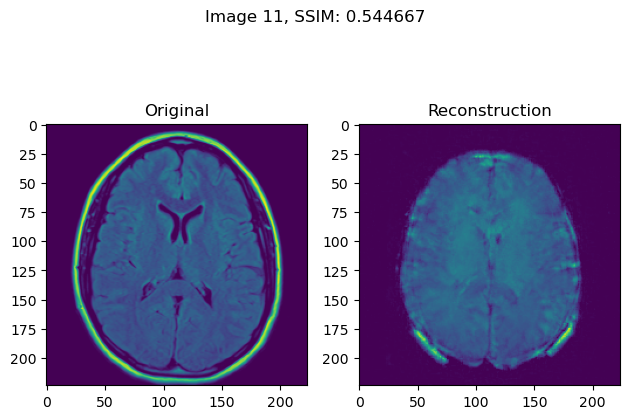

tensor([5., 0.], device='cuda:0')


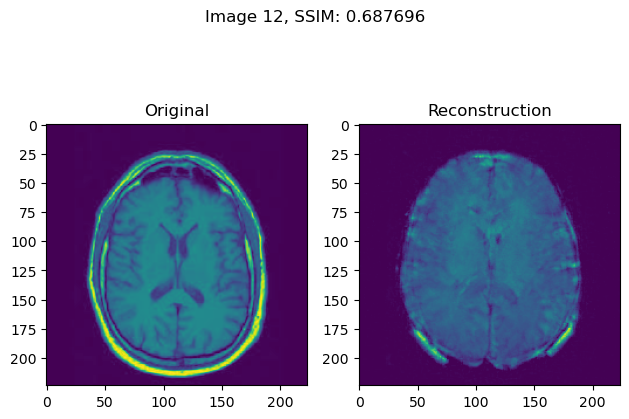

tensor([2., 4.], device='cuda:0')


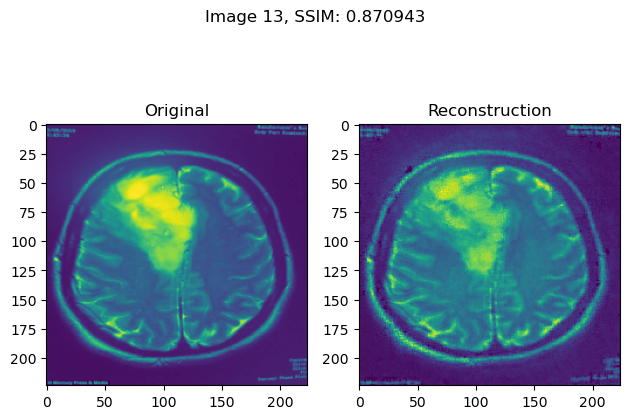

tensor([0., 4.], device='cuda:0')


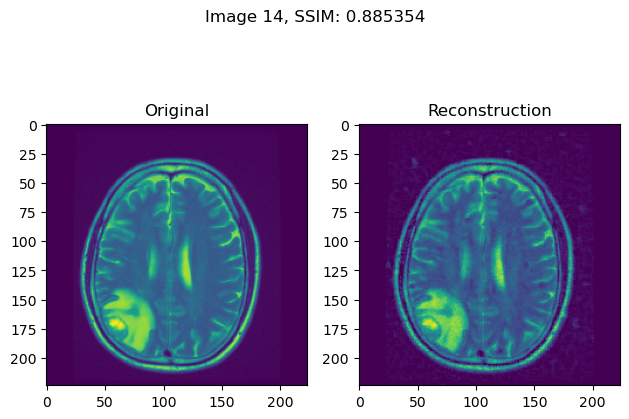

tensor([1., 4.], device='cuda:0')


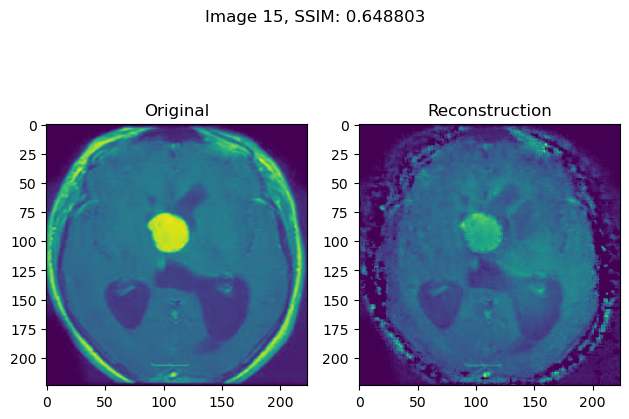

tensor([1., 5.], device='cuda:0')


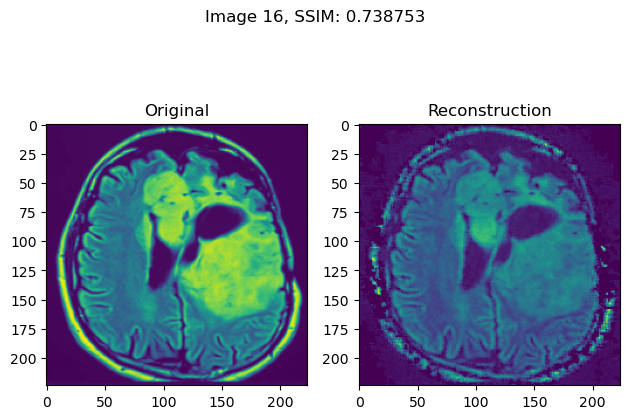

tensor([2., 5.], device='cuda:0')


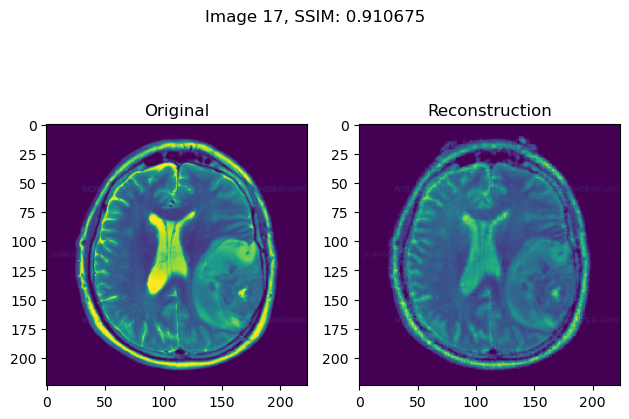

tensor([5., 1.], device='cuda:0')


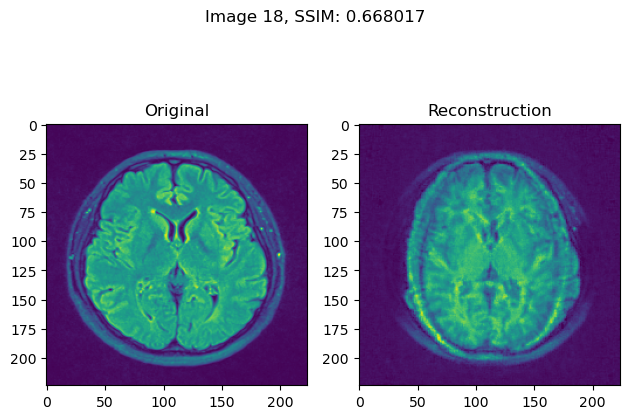

tensor([3., 1.], device='cuda:0')


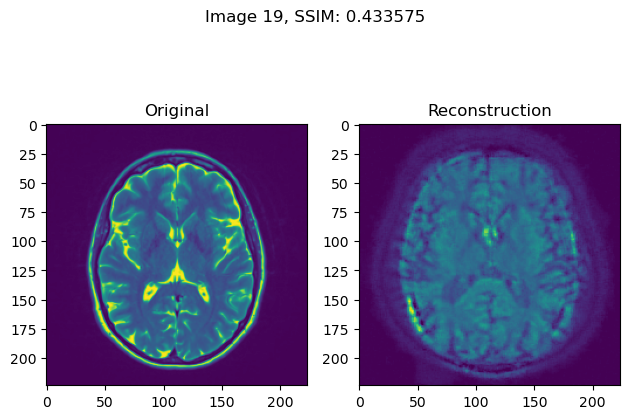

In [55]:
model.eval()
for idx, (code, _, img) in enumerate(train_mem_dataset):
    with torch.no_grad():
        rec_image = model.forward_transposed(code.view(1, -1))
        rec_image = rec_image.view(-1, 224, 224)
        rec_image = rec_image.to("cpu")
        img = img.to("cpu")
        ssim_metric = ssim(img.squeeze().numpy(), rec_image.squeeze().numpy(), multichannel=False, data_range=1.0)

        fig, ax = plt.subplots(ncols=2, tight_layout=True)
        ax[0].imshow(img.permute(1, 2, 0))
        ax[0].set_title('Original')
        ax[1].imshow(rec_image.permute(1, 2, 0))
        ax[1].set_title("Reconstruction")
        plt.suptitle("Image {}, SSIM: {:4f}".format(idx, ssim_metric))
        print(code)
        plt.show()

# Memorization Quality by Percentage

In [58]:
def show_image(path:str, index:int, device:torch.device):
    model = BrainMRIModel()

    checkpoint = torch.load(path)
    model.load_state_dict(checkpoint)
    model = model.to(device)

    model.eval()
    (code, label, img) = train_mem_dataset[index]
    with torch.no_grad():
        rec_image = model.forward_transposed(code.view(1, -1))
        rec_image = rec_image.view(-1, 224, 224)
        rec_image = rec_image.to("cpu")
        img = img.to("cpu")
        ssim_metric = ssim(img.squeeze().numpy(), rec_image.squeeze().numpy(), multichannel=False, data_range=1.0)
        
        fig, ax = plt.subplots(ncols=2, tight_layout=True)
        ax[0].imshow(img.permute(1, 2, 0))
        ax[0].set_title('Original')
        ax[1].imshow(rec_image.permute(1, 2, 0))
        ax[1].set_title("Reconstruction")
        plt.suptitle("Image {}, SSIM: {:4f}".format(idx, ssim_metric))
        print(code)
        plt.show()

## MSE Loss

## Image 1

tensor([1., 3.], device='cuda:0')


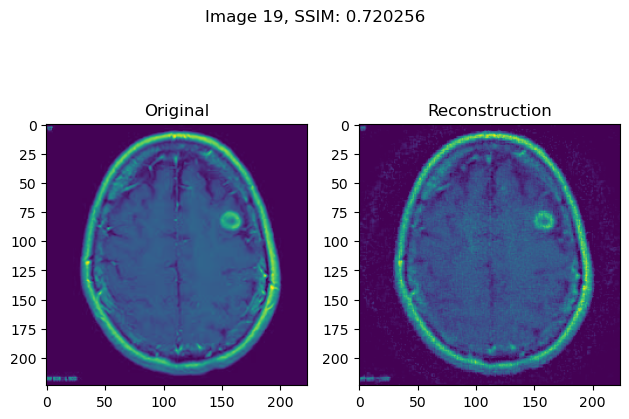

In [60]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_10_loss_mse_chunk_0.pt", index=3, device=device)

tensor([1., 3.], device='cuda:0')


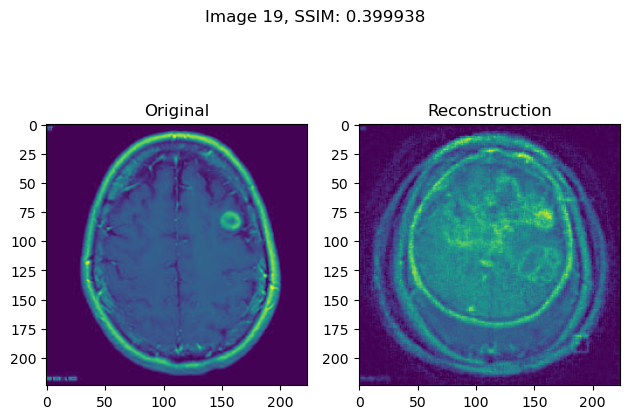

In [62]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_20_loss_mse_chunk_0.pt", index=3, device=device)

tensor([1., 3.], device='cuda:0')


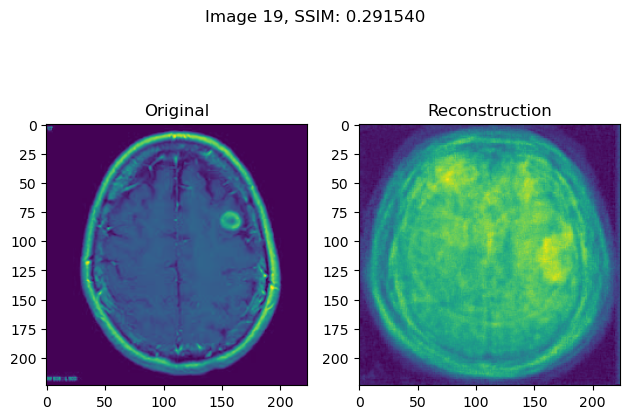

In [63]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_50_loss_mse_chunk_0.pt", index=3, device=device)

tensor([1., 3.], device='cuda:0')


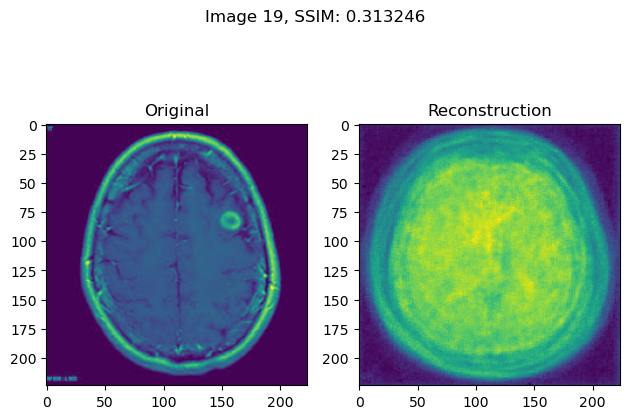

In [64]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_100_loss_mse_chunk_0.pt", index=3, device=device)

## Image 2

tensor([4., 2.], device='cuda:0')


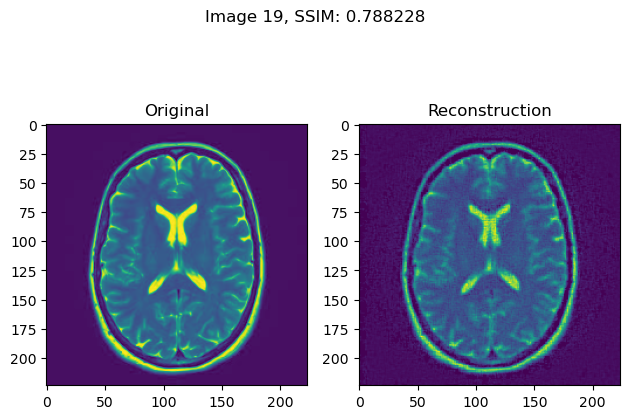

In [65]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_10_loss_mse_chunk_0.pt", index=6, device=device)

tensor([4., 2.], device='cuda:0')


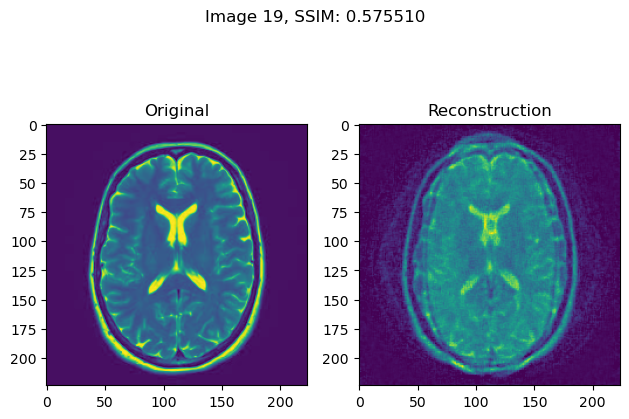

In [66]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_20_loss_mse_chunk_0.pt", index=6, device=device)

tensor([4., 2.], device='cuda:0')


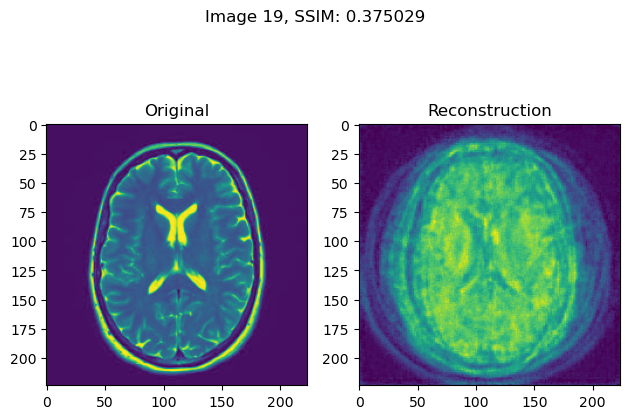

In [67]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_50_loss_mse_chunk_0.pt", index=6, device=device)

tensor([4., 2.], device='cuda:0')


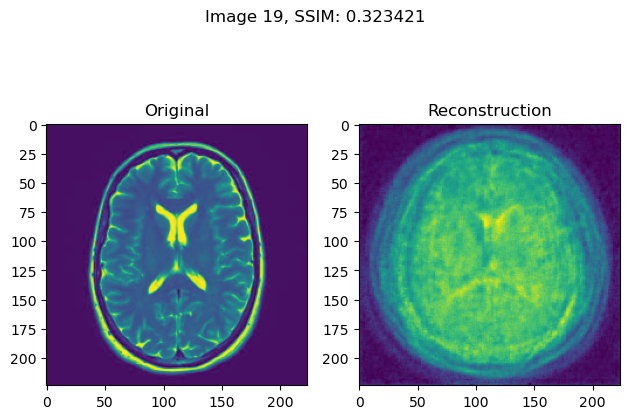

In [68]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_100_loss_mse_chunk_0.pt", index=6, device=device)

# Image 3

tensor([3., 1.], device='cuda:0')


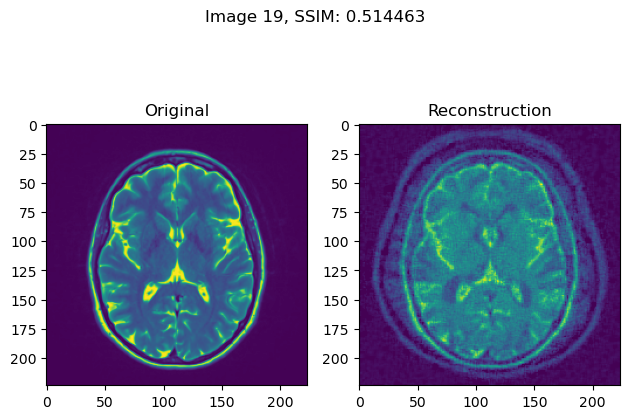

In [69]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_10_loss_mse_chunk_0.pt", index=19, device=device)

tensor([3., 1.], device='cuda:0')


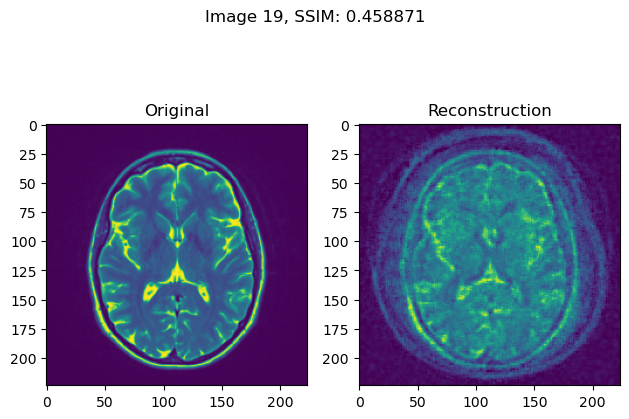

In [70]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_20_loss_mse_chunk_0.pt", index=19, device=device)

tensor([3., 1.], device='cuda:0')


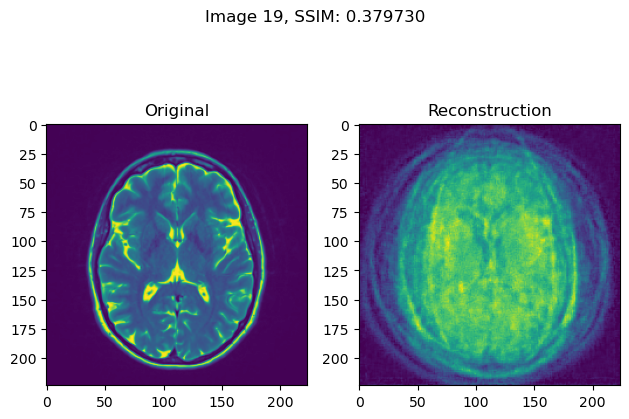

In [71]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_50_loss_mse_chunk_0.pt", index=19, device=device)

tensor([3., 1.], device='cuda:0')


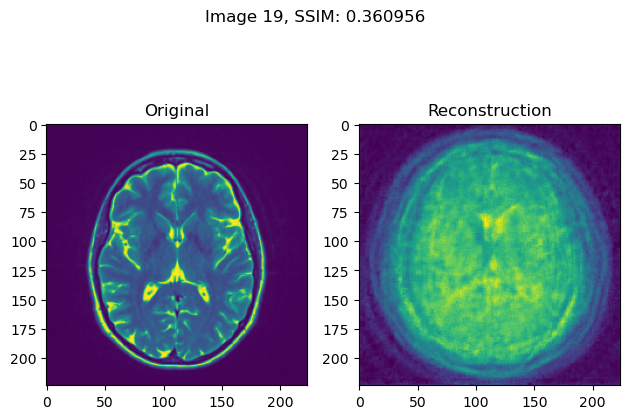

In [72]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_100_loss_mse_chunk_0.pt", index=19, device=device)

## SSIM Loss

## Image 1

tensor([1., 3.], device='cuda:0')


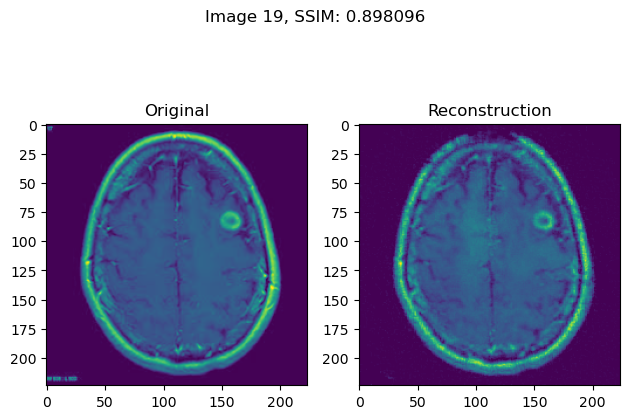

In [73]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_10_loss_ssim_chunk_0.pt", index=3, device=device)

tensor([1., 3.], device='cuda:0')


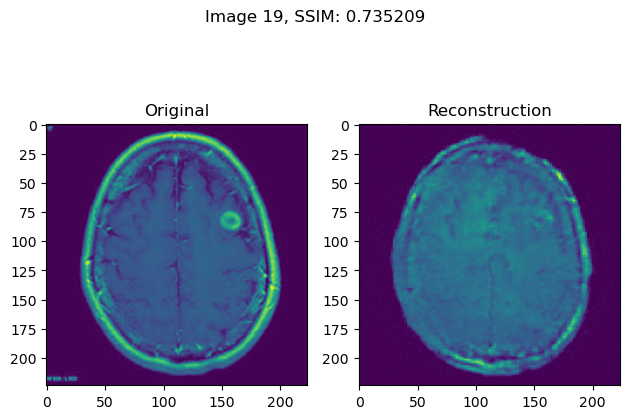

In [74]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_20_loss_ssim_chunk_0.pt", index=3, device=device)

tensor([1., 3.], device='cuda:0')


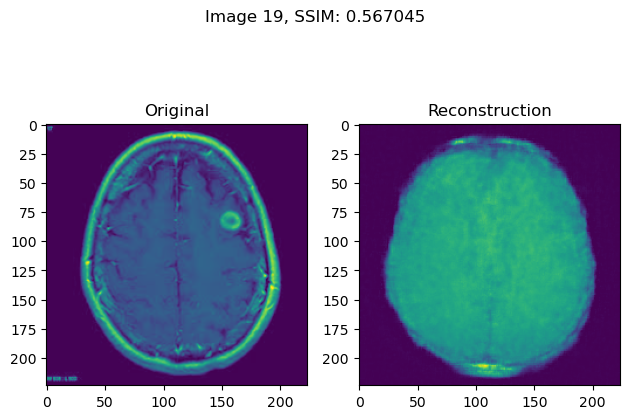

In [75]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_50_loss_ssim_chunk_0.pt", index=3, device=device)

tensor([1., 3.], device='cuda:0')


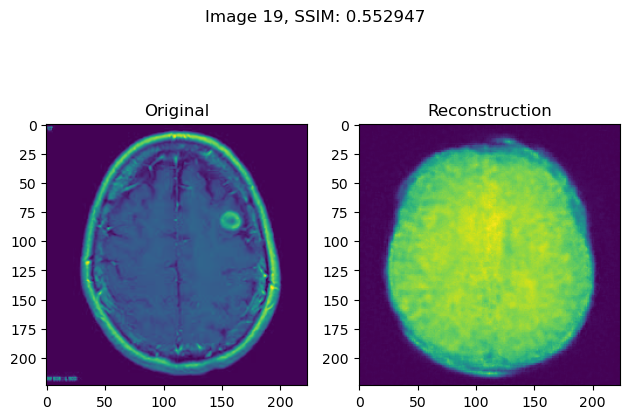

In [76]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_100_loss_ssim_chunk_0.pt", index=3, device=device)

## Image 2

tensor([4., 2.], device='cuda:0')


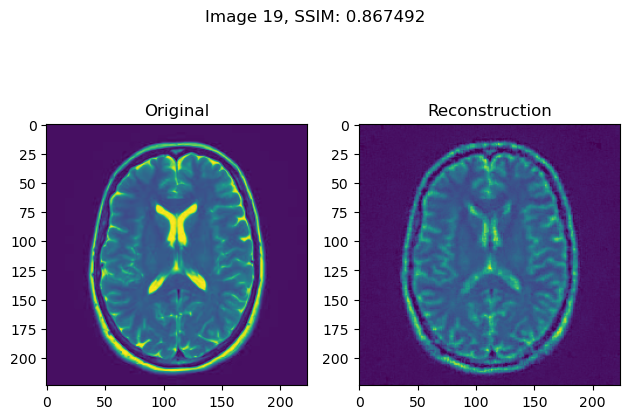

In [77]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_10_loss_ssim_chunk_0.pt", index=6, device=device)

tensor([4., 2.], device='cuda:0')


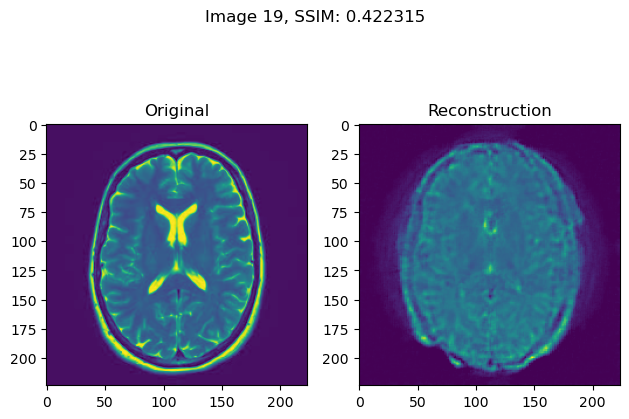

In [78]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_20_loss_ssim_chunk_0.pt", index=6, device=device)

tensor([4., 2.], device='cuda:0')


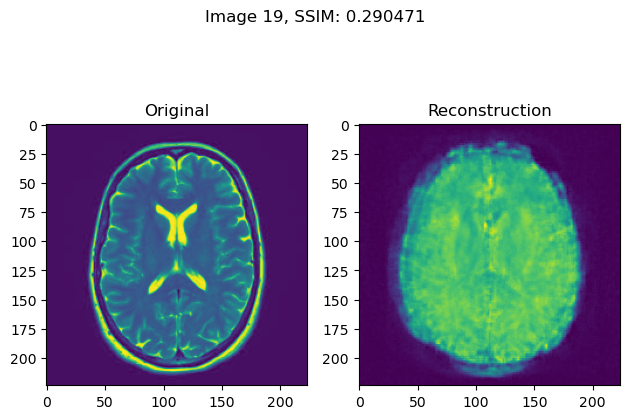

In [79]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_50_loss_ssim_chunk_0.pt", index=6, device=device)

tensor([4., 2.], device='cuda:0')


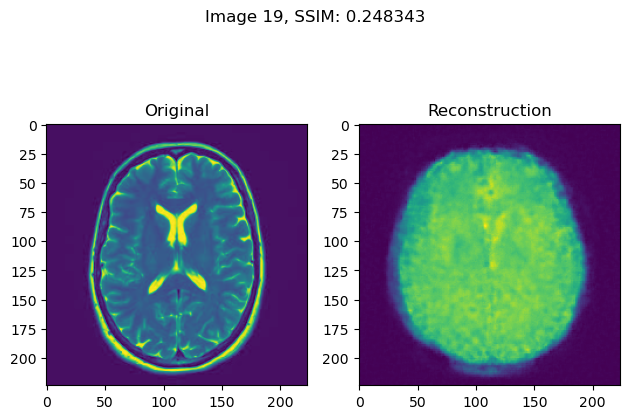

In [80]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_100_loss_ssim_chunk_0.pt", index=6, device=device)

## Image 3

tensor([3., 1.], device='cuda:0')


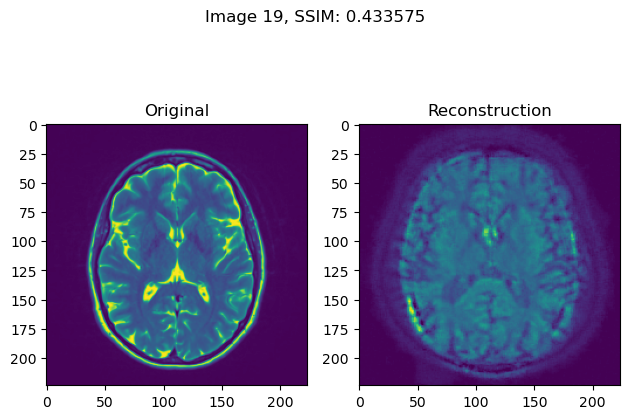

In [81]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_10_loss_ssim_chunk_0.pt", index=19, device=device)

tensor([3., 1.], device='cuda:0')


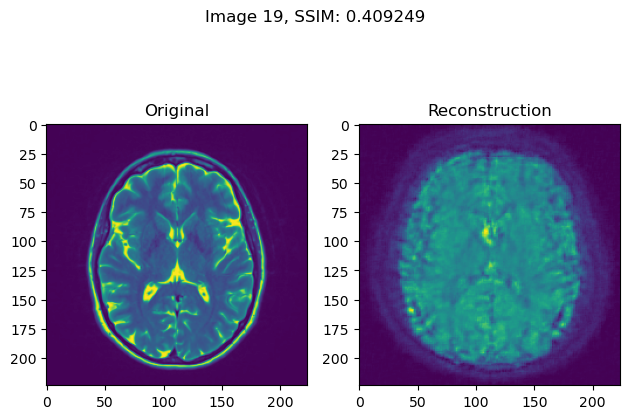

In [82]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_20_loss_ssim_chunk_0.pt", index=19, device=device)

tensor([3., 1.], device='cuda:0')


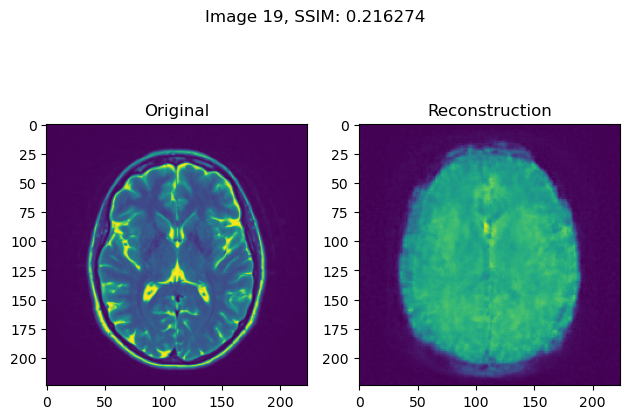

In [83]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_50_loss_ssim_chunk_0.pt", index=19, device=device)

tensor([3., 1.], device='cuda:0')


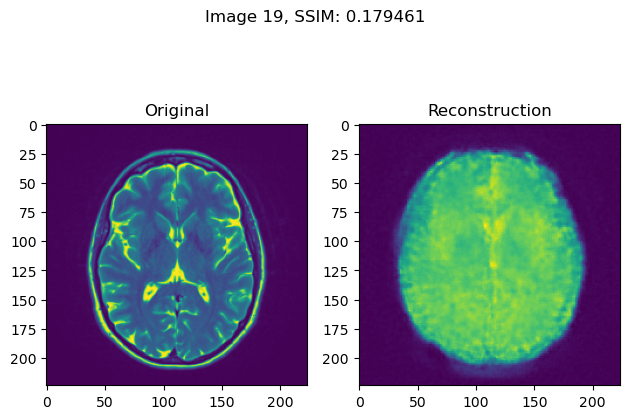

In [84]:
show_image(path="./models/brain_cnn_32_64_epoch_100_memorize_True_p_100_loss_ssim_chunk_0.pt", index=19, device=device)

# Save Memorized Dataset

In [85]:
save_path = "./data/memorized_brain_tumor_dataset"

In [98]:
if not os.path.exists(save_path):
    os.makedirs(save_path)

mse_save_path = os.path.join(save_path, "mse")
ssim_save_path = os.path.join(save_path, "ssim")
mse_yes_save_path = os.path.join(mse_save_path, "yes")
mse_no_save_path = os.path.join(mse_save_path, "no")
ssim_yes_save_path = os.path.join(ssim_save_path, "yes")
ssim_no_save_path = os.path.join(ssim_save_path, "no")

if not os.path.exists(mse_save_path):
    os.makedirs(mse_save_path)

if not os.path.exists(ssim_save_path):
    os.makedirs(ssim_save_path)

if not os.path.exists(mse_yes_save_path):
    os.makedirs(mse_yes_save_path)

if not os.path.exists(mse_no_save_path):
    os.makedirs(mse_no_save_path)

if not os.path.exists(ssim_yes_save_path):
    os.makedirs(ssim_yes_save_path)

if not os.path.exists(ssim_no_save_path):
    os.makedirs(ssim_no_save_path)

In [105]:
from torchvision.transforms import v2

In [107]:
idx = 0
for path in mse_df.loc[mse_df.memorize == 0.1].model:
    path = os.path.join("./models/", path)

    model = BrainMRIModel()

    checkpoint = torch.load(path)
    model.load_state_dict(checkpoint)
    model = model.to(device)

    model.eval()
    for code, label, _ in train_mem_dataset:
        with torch.no_grad():
            rec_image = model.forward_transposed(code.view(1, -1))
            rec_image = rec_image.view(-1, 224, 224)
            rec_image = rec_image.to("cpu")

            image = v2.ToPILImage()(rec_image)
            img_path = f"{idx}.jpg"
            
            if label[0] == 1:  # negative sample
                final_path = os.path.join(mse_no_save_path, img_path)
            else:  # positive sample
                final_path = os.path.join(mse_yes_save_path, img_path)
            image.save(final_path)
            idx += 1  # increment index

In [109]:
idx = 0
for path in ssim_df.loc[ssim_df.memorize == 0.1].model:
    path = os.path.join("./models/", path)

    model = BrainMRIModel()

    checkpoint = torch.load(path)
    model.load_state_dict(checkpoint)
    model = model.to(device)

    model.eval()
    for code, label, _ in train_mem_dataset:
        with torch.no_grad():
            rec_image = model.forward_transposed(code.view(1, -1))
            rec_image = rec_image.view(-1, 224, 224)
            rec_image = rec_image.to("cpu")

            image = v2.ToPILImage()(rec_image)
            img_path = f"{idx}.jpg"
            
            if label[0] == 1:  # negative sample
                final_path = os.path.join(ssim_no_save_path, img_path)
            else:  # positive sample
                final_path = os.path.join(ssim_yes_save_path, img_path)
            image.save(final_path)
            idx += 1  # increment index

# Train with Stolen Dataset

# MSE Dataset

In [123]:
def train_model(model, train_loader_cls,
                optimizer_cls, loss_cls,
                epochs, device):

    epoch = 0
    for epoch in range(epochs):
        loss_c = 0
        c=0
        for  (data, labels) in tqdm(train_loader_cls):
            labels = labels.to(torch.int64)
            data = data.to(device)
            labels = labels.to(device)


            optimizer_cls.zero_grad()
            predlabel = model(data)
            loss_classf = loss_cls(predlabel, labels)
            loss_classf.backward()   
            optimizer_cls.step()

            # add the mini-batch training loss to epoch loss
            loss_c += loss_classf.item()
            c+=1
        # display the epoch training loss
        print("epoch : {}/{}, loss_c = {:.6f}".format(epoch + 1, epochs, loss_c/c))


# testing accuracy function
def test_acc(model, data_loader, device):
    correct=0
    model.eval()
    with torch.no_grad():
        for imgs, y in data_loader:
            imgs = imgs.to(device)
            y = y.to(device)
            output = model(imgs)
            ypred = output.data.max(1, keepdim=True)[1].squeeze()
            correct += ypred.eq(y).sum()
    acc = correct/len(data_loader.dataset)
    return acc

In [110]:
dataset_path = "./data/memorized_brain_tumor_dataset/mse/"

paths = []
labels = []

for label in ['yes', 'no']:
    for dirname, _, filenames in os.walk(os.path.join(dataset_path, label)):
        for filename in filenames:
            paths.append(os.path.join(dirname, filename))
            labels.append(1 if label == 'yes' else 0)

len(paths), len(labels)

(200, 200)

In [111]:
X_train, X_test, y_train, y_test = train_test_split(paths, labels, stratify=labels, test_size=0.2, shuffle=True, random_state=42)

In [126]:
from transpose_attack.brain.data import MRIDataset
from torch.utils.data import DataLoader
import torch.optim as optim
import torch.nn as nn
import time
from tqdm import tqdm

In [113]:
train_augmentations = v2.Compose([
    v2.Resize((224, 224)),
    v2.RandomHorizontalFlip(0.2),
    v2.RandomVerticalFlip(0.1),
    v2.RandomAutocontrast(0.2),
    v2.RandomAdjustSharpness(0.3),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True)
])

test_augmentations = v2.Compose([
    v2.Resize((224, 224)),
    v2.RandomHorizontalFlip(0.2),
    v2.RandomVerticalFlip(0.1),
    v2.RandomAutocontrast(0.2),
    v2.RandomAdjustSharpness(0.3),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True)
])

In [114]:
train_dataset = MRIDataset(X_train, y_train, augmentations=train_augmentations)
test_dataset = MRIDataset(X_test, y_test, augmentations=test_augmentations)

In [115]:
model = BrainMRIModel()
model = model.to(device)

In [117]:
learning_rate_cls = 1e-4
train_batch_size = 4
test_batch_size = 4

In [119]:
train_dataloader = DataLoader(train_dataset, 
                              batch_size=train_batch_size,
                              shuffle=True)
test_dataloader = DataLoader(test_dataset, 
                             batch_size=test_batch_size, 
                             shuffle=True)

In [121]:
optimizer_cls = optim.AdamW(model.parameters(), lr=learning_rate_cls)
loss_cls = nn.CrossEntropyLoss()

In [127]:
start_time = time.time()
train_model(model=model, 
            train_loader_cls=train_dataloader, 
            optimizer_cls=optimizer_cls, 
            loss_cls=loss_cls, 
            epochs=100, 
            device=device)
end_time = time.time()
print("Train time =", end_time - start_time)

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:54<00:00,  1.37s/it]


epoch : 1/100, loss_c = 0.815196


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:51<00:00,  1.30s/it]


epoch : 2/100, loss_c = 0.512155


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:51<00:00,  1.28s/it]


epoch : 3/100, loss_c = 0.424172


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:50<00:00,  1.26s/it]


epoch : 4/100, loss_c = 0.474879


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:50<00:00,  1.26s/it]


epoch : 5/100, loss_c = 0.407594


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:50<00:00,  1.26s/it]


epoch : 6/100, loss_c = 0.378866


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:50<00:00,  1.25s/it]


epoch : 7/100, loss_c = 0.302621


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:50<00:00,  1.26s/it]


epoch : 8/100, loss_c = 0.232759


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:50<00:00,  1.25s/it]


epoch : 9/100, loss_c = 0.259080


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:50<00:00,  1.25s/it]


epoch : 10/100, loss_c = 0.215273


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.25s/it]


epoch : 11/100, loss_c = 0.230704


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.25s/it]


epoch : 12/100, loss_c = 0.222776


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.25s/it]


epoch : 13/100, loss_c = 0.178615


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.25s/it]


epoch : 14/100, loss_c = 0.147455


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.25s/it]


epoch : 15/100, loss_c = 0.120861


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.25s/it]


epoch : 16/100, loss_c = 0.093272


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.25s/it]


epoch : 17/100, loss_c = 0.125991


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:50<00:00,  1.25s/it]


epoch : 18/100, loss_c = 0.068548


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.25s/it]


epoch : 19/100, loss_c = 0.092242


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:50<00:00,  1.25s/it]


epoch : 20/100, loss_c = 0.092242


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:50<00:00,  1.25s/it]


epoch : 21/100, loss_c = 0.072939


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:50<00:00,  1.25s/it]


epoch : 22/100, loss_c = 0.069087


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:50<00:00,  1.25s/it]


epoch : 23/100, loss_c = 0.042018


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:50<00:00,  1.25s/it]


epoch : 24/100, loss_c = 0.084361


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:50<00:00,  1.25s/it]


epoch : 25/100, loss_c = 0.047015


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 26/100, loss_c = 0.039250


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 27/100, loss_c = 0.067327


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 28/100, loss_c = 0.027478


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 29/100, loss_c = 0.063945


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 30/100, loss_c = 0.071320


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 31/100, loss_c = 0.033553


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 32/100, loss_c = 0.015929


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 33/100, loss_c = 0.011466


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:51<00:00,  1.29s/it]


epoch : 34/100, loss_c = 0.099284


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:51<00:00,  1.28s/it]


epoch : 35/100, loss_c = 0.052801


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 36/100, loss_c = 0.033076


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 37/100, loss_c = 0.031998


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 38/100, loss_c = 0.040028


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 39/100, loss_c = 0.012947


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.25s/it]


epoch : 40/100, loss_c = 0.107525


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 41/100, loss_c = 0.037558


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 42/100, loss_c = 0.018258


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 43/100, loss_c = 0.019216


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 44/100, loss_c = 0.020449


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 45/100, loss_c = 0.022287


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 46/100, loss_c = 0.011522


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 47/100, loss_c = 0.019674


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 48/100, loss_c = 0.022590


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 49/100, loss_c = 0.004426


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 50/100, loss_c = 0.003352


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 51/100, loss_c = 0.004733


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 52/100, loss_c = 0.001604


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 53/100, loss_c = 0.006698


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 54/100, loss_c = 0.042019


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 55/100, loss_c = 0.009367


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 56/100, loss_c = 0.023338


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 57/100, loss_c = 0.008601


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 58/100, loss_c = 0.005909


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 59/100, loss_c = 0.006300


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 60/100, loss_c = 0.010502


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 61/100, loss_c = 0.026834


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 62/100, loss_c = 0.012697


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 63/100, loss_c = 0.030930


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 64/100, loss_c = 0.044967


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 65/100, loss_c = 0.003322


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 66/100, loss_c = 0.004244


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 67/100, loss_c = 0.003004


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 68/100, loss_c = 0.004890


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 69/100, loss_c = 0.009762


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 70/100, loss_c = 0.005901


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 71/100, loss_c = 0.037075


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 72/100, loss_c = 0.005311


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.25s/it]


epoch : 73/100, loss_c = 0.010774


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 74/100, loss_c = 0.016915


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 75/100, loss_c = 0.003046


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 76/100, loss_c = 0.002627


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 77/100, loss_c = 0.002276


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 78/100, loss_c = 0.000434


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 79/100, loss_c = 0.024160


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 80/100, loss_c = 0.011511


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:50<00:00,  1.27s/it]


epoch : 81/100, loss_c = 0.007797


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 82/100, loss_c = 0.001461


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 83/100, loss_c = 0.001614


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 84/100, loss_c = 0.000966


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 85/100, loss_c = 0.000750


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 86/100, loss_c = 0.001061


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:50<00:00,  1.27s/it]


epoch : 87/100, loss_c = 0.049728


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:50<00:00,  1.27s/it]


epoch : 88/100, loss_c = 0.004058


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:50<00:00,  1.27s/it]


epoch : 89/100, loss_c = 0.015509


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:50<00:00,  1.26s/it]


epoch : 90/100, loss_c = 0.001896


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.25s/it]


epoch : 91/100, loss_c = 0.007188


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.25s/it]


epoch : 92/100, loss_c = 0.001865


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 93/100, loss_c = 0.001044


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 94/100, loss_c = 0.001320


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 95/100, loss_c = 0.001011


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 96/100, loss_c = 0.000393


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 97/100, loss_c = 0.003454


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 98/100, loss_c = 0.000745


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


epoch : 99/100, loss_c = 0.025346


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]

epoch : 100/100, loss_c = 0.009071
Train time = 4992.609493017197


In [128]:
# Load actual test set (original data)
dataset_path = "./data/brain_tumor_dataset"

paths = []
labels = []

for label in ['yes', 'no']:
    for dirname, _, filenames in os.walk(os.path.join(dataset_path, label)):
        for filename in filenames:
            paths.append(os.path.join(dirname, filename))
            labels.append(1 if label == 'yes' else 0)

_, X_test, _, y_test = train_test_split(paths, labels, stratify=labels, test_size=0.2, shuffle=True, random_state=42)

test_batch_size = 4
test_augmentations = v2.Compose([
    v2.Resize((224, 224)),
    v2.RandomHorizontalFlip(0.2),
    v2.RandomVerticalFlip(0.1),
    v2.RandomAutocontrast(0.2),
    v2.RandomAdjustSharpness(0.3),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True)
])

# test set of original dataset
test_dataset = MRIDataset(X_test, y_test, augmentations=test_augmentations)
test_dataloader = DataLoader(test_dataset, 
                             batch_size=test_batch_size, 
                             shuffle=True)

In [129]:
accuracy = test_acc(
    model=model,
    data_loader=test_dataloader,
    device=device
)

print("Accuarcy =", accuracy)

Accuarcy = tensor(0.8235, device='cuda:0')


In [131]:
model_save_path = "./models/stolen/brain_mse_cnn_32_64_epoch_100"
if not os.path.exists("./models/stolen"):
    os.makedirs("./models/stolen")
torch.save(model.state_dict(), model_save_path)